<a href="https://colab.research.google.com/github/Nainika-stack/hidden-image-detection-computer-vision/blob/main/hidden_image_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python matplotlib numpy

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving challenge.png to challenge.png
User uploaded file "challenge.png" with length 383411 bytes


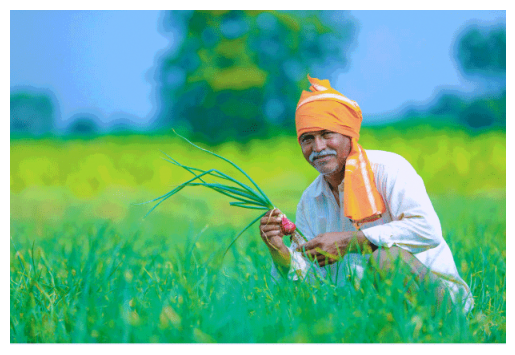

In [ ]:
import matplotlib.pyplot as plt
import cv2

img = cv2.imread("challenge.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis("off")
plt.show()

In [ ]:
# Load image
img = cv2.imread("challenge.png")


In [ ]:
# Convert BGR to RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print("Shape:", img.shape)
print("Datatype:", img.dtype)

Shape: (419, 620, 3)
Datatype: uint8


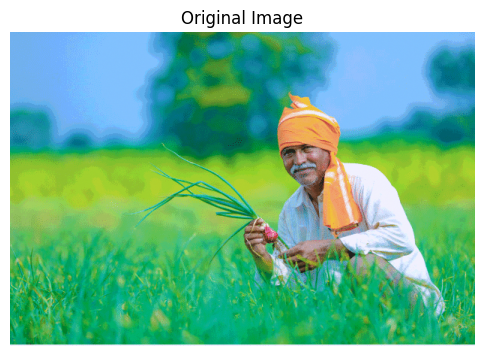

In [ ]:
# Display original image
plt.figure(figsize=(6,6))
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis("off")
plt.show()

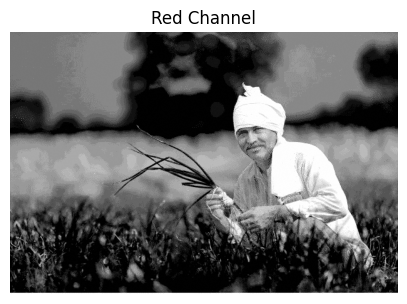

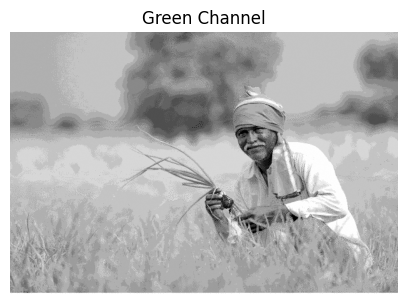

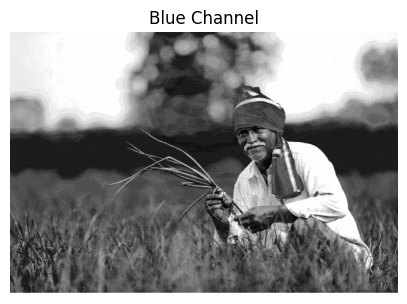

In [ ]:
# ---------------------------------------------------
# 1. Extract individual color channels
# ---------------------------------------------------

channels = ['Red', 'Green', 'Blue']

for i, channel in enumerate(channels):
    plt.figure(figsize=(5,5))
    plt.imshow(img_rgb[:,:,i], cmap='gray')
    plt.title(f"{channel} Channel")
    plt.axis("off")
    plt.show()

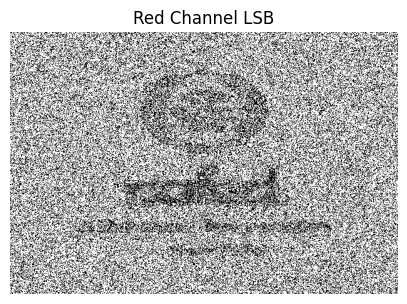

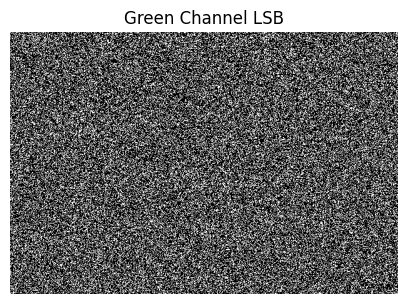

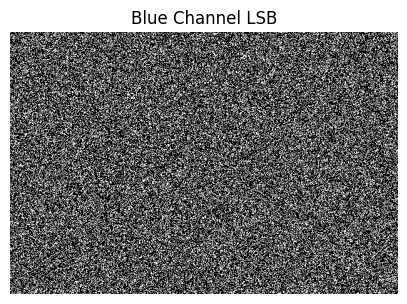

In [ ]:
# ---------------------------------------------------
# 2. Extract Least Significant Bit (LSB)
# ---------------------------------------------------

for i, channel in enumerate(channels):

    # Get LSB
    lsb = img[:,:,i] & 1

    # Scale for visibility
    lsb = lsb * 255

    plt.figure(figsize=(5,5))
    plt.imshow(lsb, cmap='gray')
    plt.title(f"{channel} Channel LSB")
    plt.axis("off")
    plt.show()

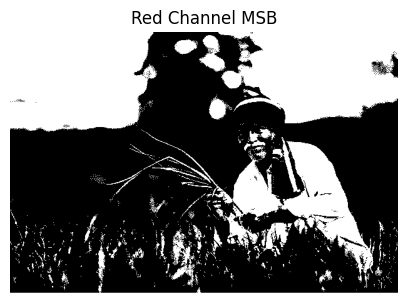

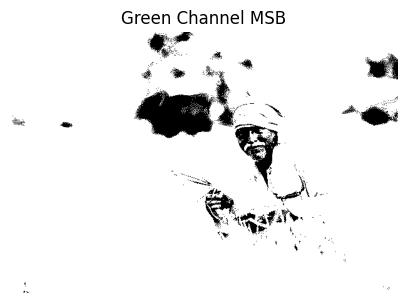

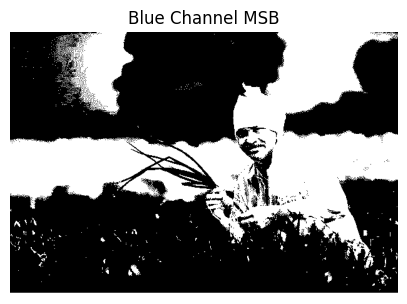

In [ ]:
# ---------------------------------------------------
# 3. Extract Most Significant Bit
# ---------------------------------------------------

for i, channel in enumerate(channels):

    msb = (img[:,:,i] >> 7) * 255

    plt.figure(figsize=(5,5))
    plt.imshow(msb, cmap='gray')
    plt.title(f"{channel} Channel MSB")
    plt.axis("off")
    plt.show()


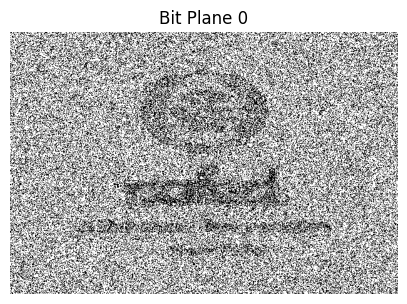

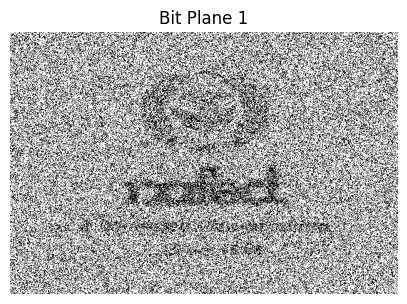

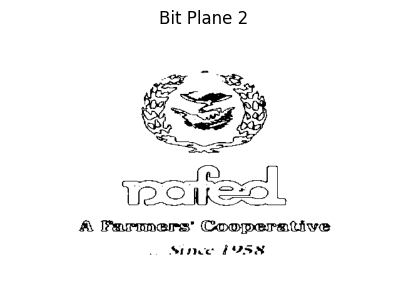

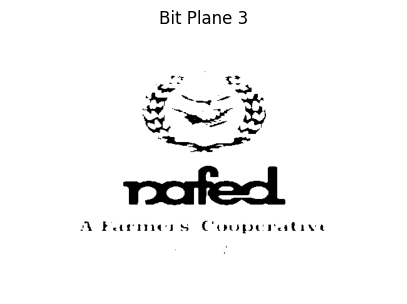

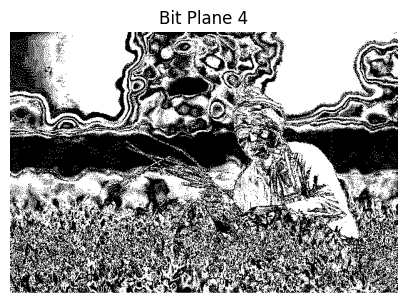

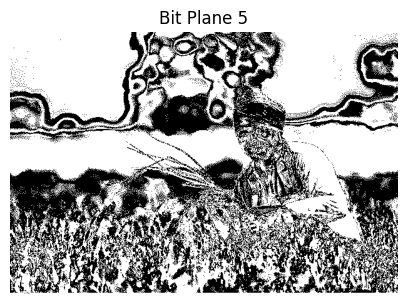

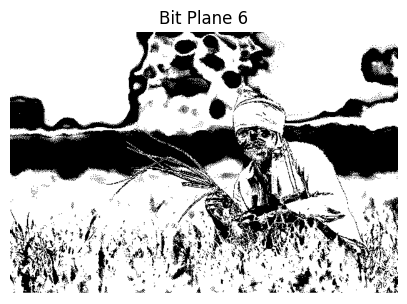

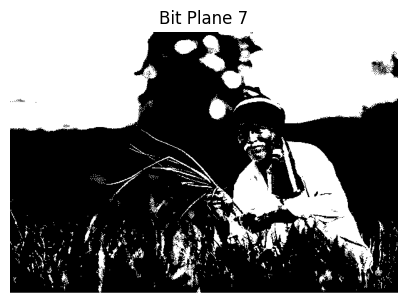

In [ ]:
# ---------------------------------------------------
# 4. Bit Plane Slicing
# ---------------------------------------------------

for bit in range(8):

    plane = ((img[:,:,0] >> bit) & 1) * 255

    plt.figure(figsize=(5,5))
    plt.imshow(plane, cmap='gray')
    plt.title(f"Bit Plane {bit}")
    plt.axis("off")
    plt.show()

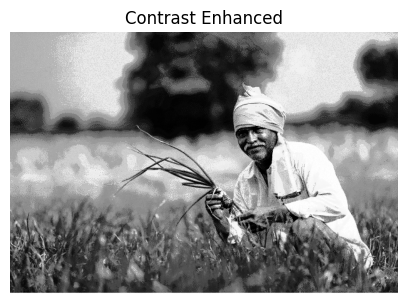

In [ ]:
# ---------------------------------------------------
# 5. High Contrast Enhancement
# ---------------------------------------------------

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Increase contrast
enhanced = cv2.equalizeHist(gray)

plt.figure(figsize=(5,5))
plt.imshow(enhanced, cmap='gray')
plt.title("Contrast Enhanced")
plt.axis("off")
plt.show()


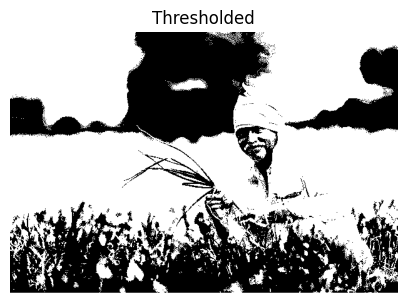

In [ ]:
# ---------------------------------------------------
# 6. Thresholding
# ---------------------------------------------------

_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(5,5))
plt.imshow(thresh, cmap='gray')
plt.title("Thresholded")
plt.axis("off")
plt.show()

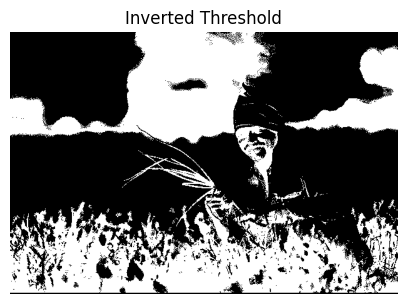

In [ ]:
# ---------------------------------------------------
# 7. Inverted Threshold
# ---------------------------------------------------

_, thresh_inv = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)

plt.figure(figsize=(5,5))
plt.imshow(thresh_inv, cmap='gray')
plt.title("Inverted Threshold")
plt.axis("off")
plt.show()

In [ ]:
# ---------------------------------------------------
# 8. Save useful outputs
# ---------------------------------------------------

cv2.imwrite("hidden_lsb.png", lsb)
cv2.imwrite("enhanced.png", enhanced)
cv2.imwrite("threshold.png", thresh)

print("Processing completed.")

Processing completed.


Shape: (419, 620, 3)


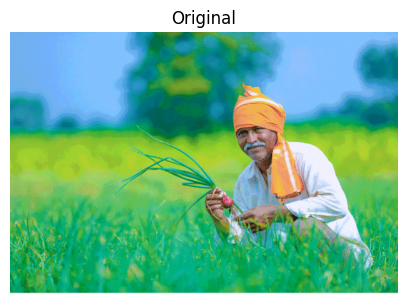

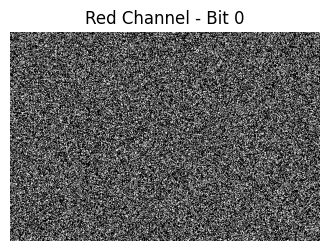

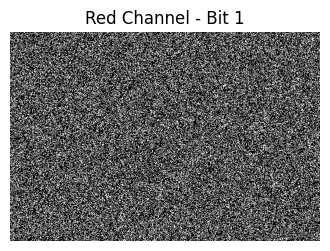

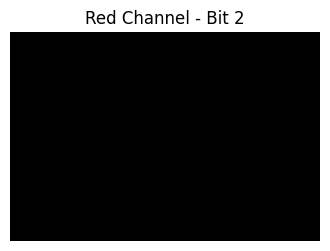

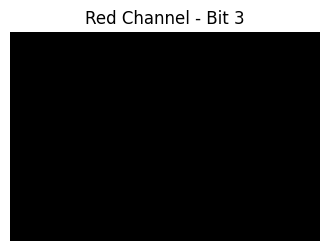

...

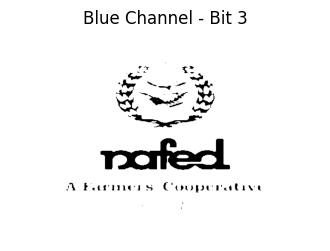

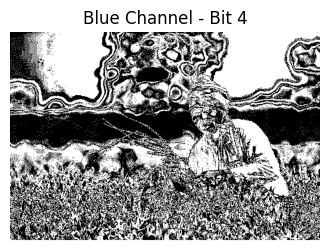

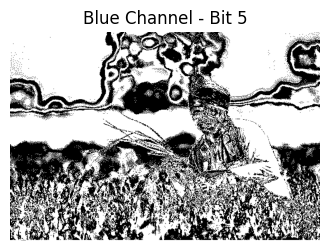

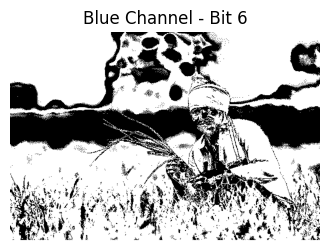

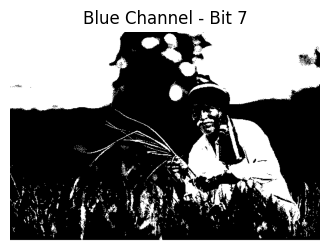

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load image
img = Image.open("challenge.png")

# Convert to numpy
img = np.array(img)

print("Shape:", img.shape)

# Show original
plt.figure(figsize=(5,5))
plt.imshow(img)
plt.title("Original")
plt.axis("off")
plt.show()


# -----------------------------------------
# CHECK ALL CHANNELS + ALL BIT PLANES
# -----------------------------------------

channels = ['Red', 'Green', 'Blue']

for c in range(3):

    for bit in range(8):

        # Extract bit plane
        plane = ((img[:,:,c] >> bit) & 1) * 255

        plt.figure(figsize=(4,4))
        plt.imshow(plane, cmap='gray')
        plt.title(f"{channels[c]} Channel - Bit {bit}")
        plt.axis("off")
        plt.show()

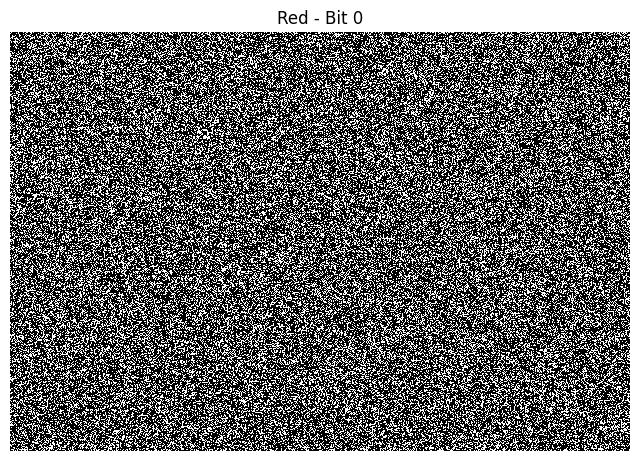

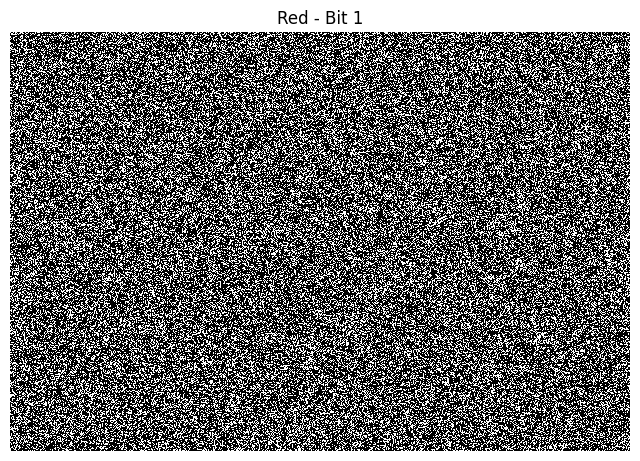

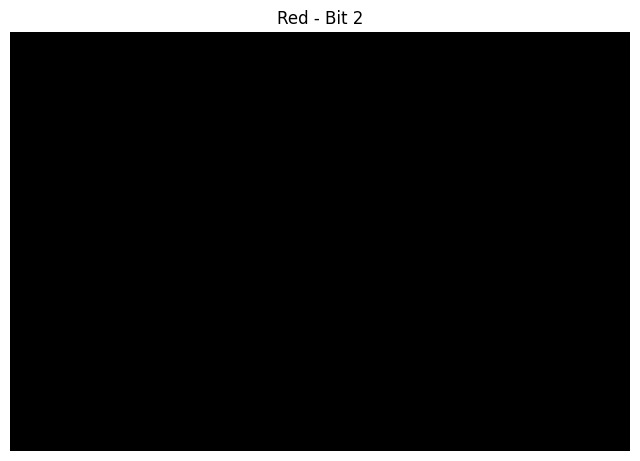

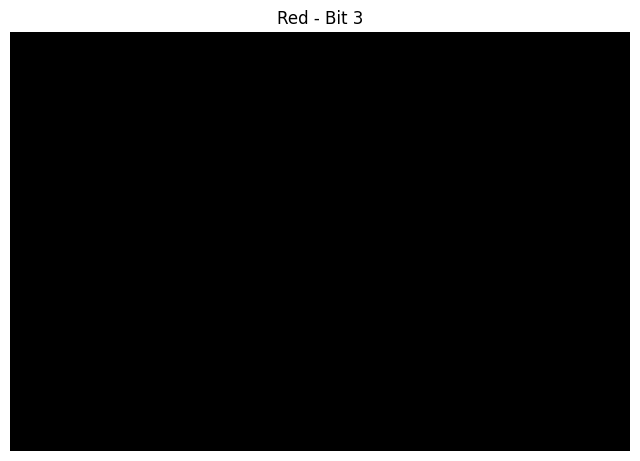

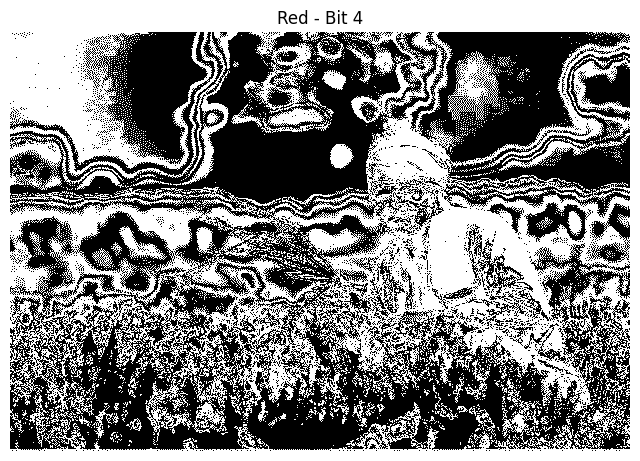

...

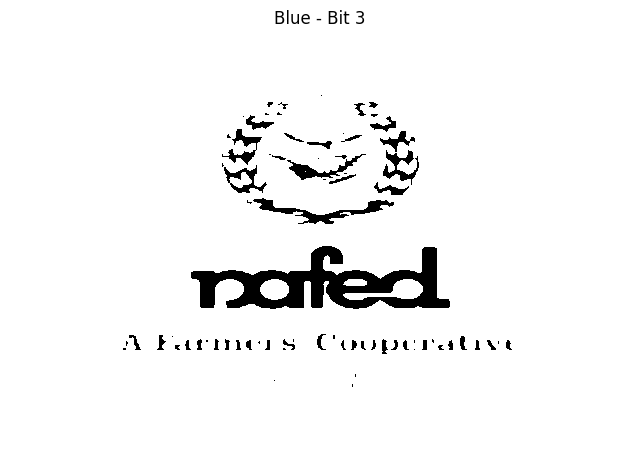

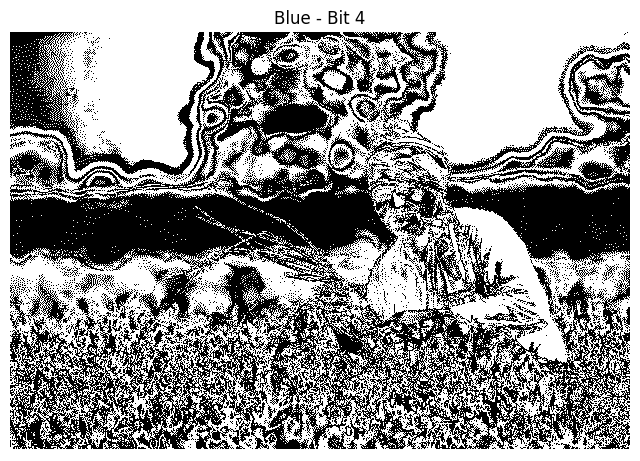

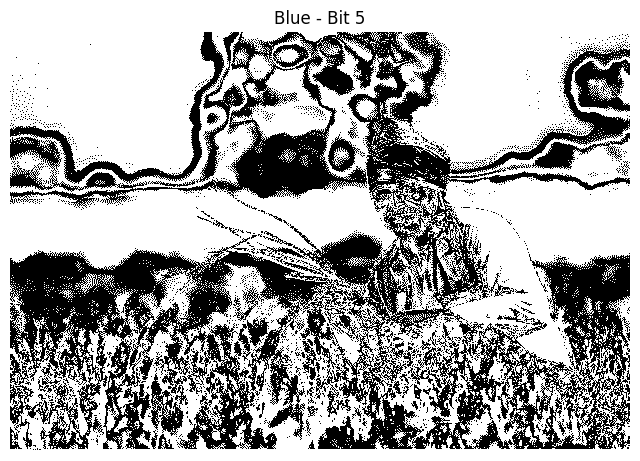

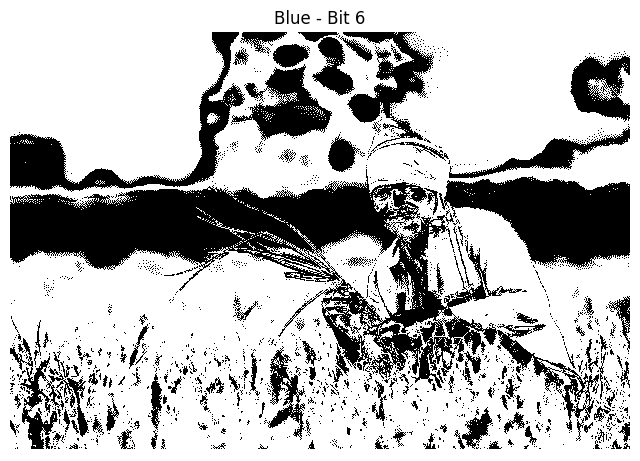

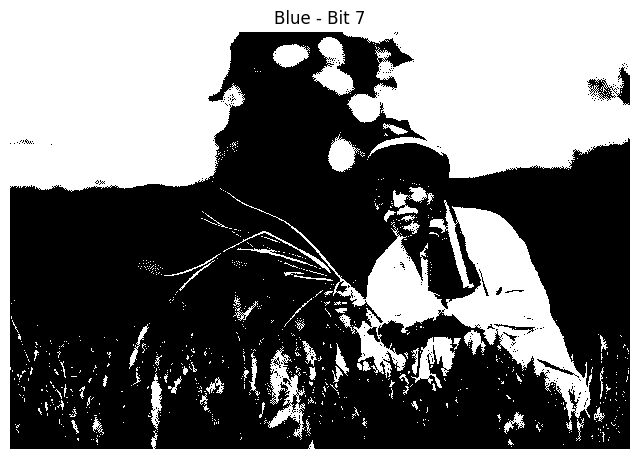

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

img = Image.open("challenge.png")
img = np.array(img)

channels = ['Red', 'Green', 'Blue']

for c in range(3):

    for bit in range(8):

        plane = ((img[:,:,c] >> bit) & 1) * 255

        plt.figure(figsize=(8,8))
        plt.imshow(plane, cmap='gray')

        plt.title(f"{channels[c]} - Bit {bit}")

        plt.axis("off")
        plt.show()

In [ ]:
plane = plane * 10
plane = np.clip(plane, 0, 255)

array([[246, 246, 246, ..., 246, 246, 246],
       [246, 246, 246, ..., 246, 246, 246],
       [246, 246, 246, ..., 246, 246, 246],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [246, 246, 246, ..., 246, 246, 246],
       [246, 246, 246, ..., 246, 246, 246]], dtype=uint8)
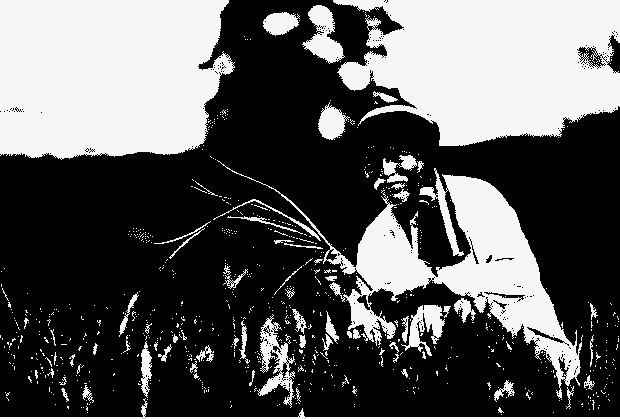

In [ ]:
plane

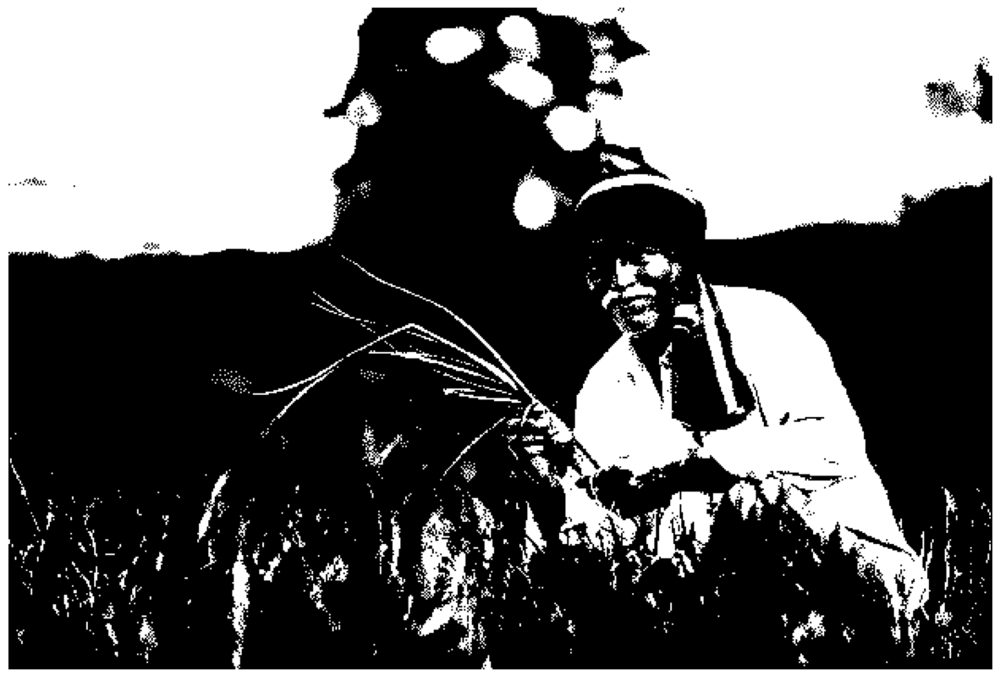

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(plane, cmap='gray')
plt.axis("off")
plt.show()

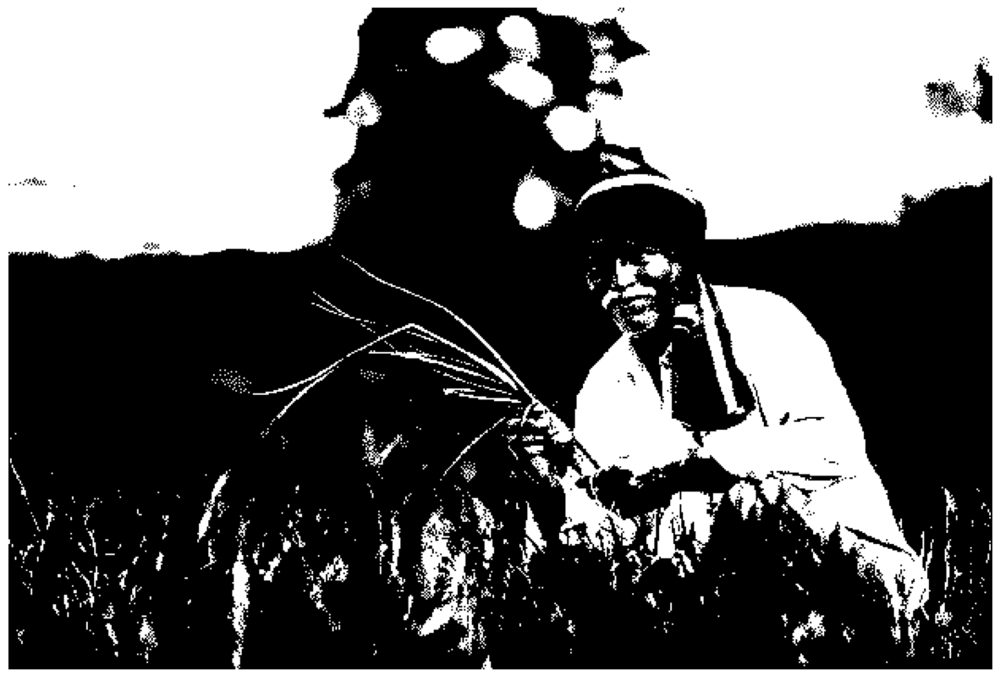

In [ ]:
enhanced = plane * 20
enhanced = np.clip(enhanced, 0, 255)

plt.figure(figsize=(15,15))
plt.imshow(enhanced, cmap='gray')
plt.axis("off")
plt.show()

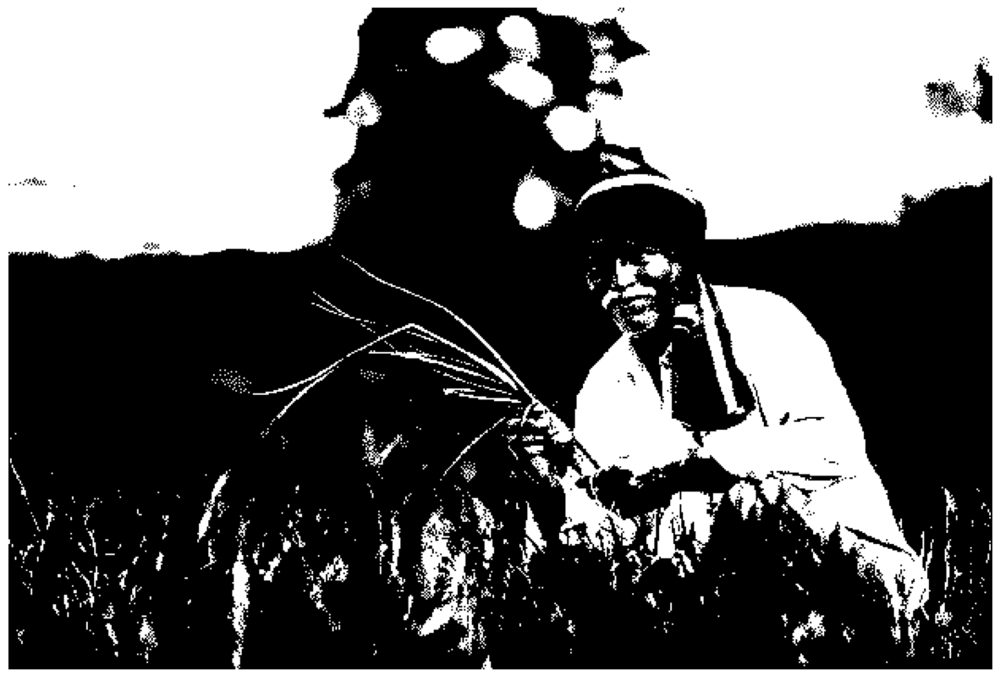

In [ ]:
binary = (plane > 128) * 255

plt.figure(figsize=(15,15))
plt.imshow(binary, cmap='gray')
plt.axis("off")
plt.show()